In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
Customer_Churn=pd.read_csv("customer_churn.csv")
Customer_Churn

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


This is a classification problem, String data is present which needs to be encoded.

In [3]:
Customer_Churn.shape

(7043, 21)

There are 7043 rows and 21 columns in the dataset.

### DataFrame Description

The dataset contains 21 features having different impact on the customer_churn. Column 1 contains customerID which uniquely identifies the customer. Gender of the customer male or female is the second column.Partner column indicates that the whether customer have a partner or not.Dependent column indicates that wheteher  customer have a dependent or not, dependents could be children,parents, grandparents etc. Tenure column indicates about the months that a customer has been with the company by the end of the quarter speciifed. Phone service column indicates whether customer has subscribed the home phone service with the company or not.MultipleLines indicates whether the customer have multiple telephone lines subscribed with the company or not along with no phone service also.InternetService column indicates whether the customer has subscribed company's internet service or not or type of internet service like DSL,FiberOptic,Cable.Online security service column indicates that whether the customer has subscribed additional online security service of the company or not.Online Backup column indicates that whetehr the customer have subscribed online backup service provided by the company or not.Device Protection column indicates that Indicates if the customer subscribes to an additional device protection plan for their Internet equipment provided by the company. Tech support indicates whether the customer have an additional device protection plan for their internet equipment provided by the company or not.Streaming TV column indicates about the internet service to stream television programing from the third party provider.Streaming Movies indicates whether the customer uses their internet service to stream the movies from the third party provider.Contract column indicates about the current contract type month-to-month,one year,two year.Paperless billing column indicates whether the customer has chosen the paperless billing or not.PaymentMethod indicates about the mode of payment done by the customer to the company like Bank Withdrawl,Credit Card, Mailed Check.Monthly charges column indicates about all the monthly charges for all the services to the company.Total charges column indicates about the total charges calculated at the end of the quarter specified above.Churn Label indicates whether the customer left the company this quarter or not, Yes or No.

### Checking the Datatypes of the columns


In [4]:
Customer_Churn.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

We have float, int and object type values in our dataset.

In [5]:
Customer_Churn.head(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
Customer_Churn.tail(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes
7042,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.65,6844.5,No


In [7]:
Customer_Churn.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

There are no missing values in the dataset.

In [8]:
Customer_Churn['Churn'].unique()

array(['No', 'Yes'], dtype=object)

In [9]:
Customer_Churn.loc[Customer_Churn["Churn"]== " "] #for checking empty value

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn


In [10]:
Customer_Churn.loc[Customer_Churn["TotalCharges"]== " "] #for checking empty value

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


There are no null values in the target column.

In [11]:
Customer_Churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


Here TotalCharges is object type which needs to be converted into float type.

In [12]:
Customer_Churn["TotalCharges"]=Customer_Churn["TotalCharges"].replace(" ",np.nan)

In [13]:
Customer_Churn.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

There are 11 missing values in the TotalCharges column.

In [14]:
Customer_Churn["TotalCharges"]=Customer_Churn["TotalCharges"].astype(float)

In [15]:
Customer_Churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


### Using Simple Imputer for Imputing Data

In [16]:
from sklearn.impute import SimpleImputer
imp=SimpleImputer(missing_values = np.nan,strategy="median")
Customer_Churn['TotalCharges']=imp.fit_transform(Customer_Churn['TotalCharges'].values.reshape(-1,1))

In [17]:
Customer_Churn.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

### Univariate Analysis for Classification

### Making DataFrame for Nominal Data

In [18]:
Customer_Churn_nominal=Customer_Churn[['gender','SeniorCitizen','Partner','Dependents','PhoneService','MultipleLines','InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','Contract','PaperlessBilling','PaymentMethod','Churn']].copy()
Customer_Churn_nominal

,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
0,Female,0,Yes,No,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,No
1,Male,0,No,No,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,No
2,Male,0,No,No,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,Yes
3,Male,0,No,No,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),No
4,Female,0,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,Male,0,Yes,Yes,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,No
7039,Female,0,Yes,Yes,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),No
7040,Female,0,Yes,Yes,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,No
7041,Male,1,Yes,No,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,Yes


In [19]:
Customer_Churn_nominal.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn'],
      dtype='object')

### Vizualization of the data :

For the nominal categorical data we will use countplot as it will give the frequency of the classes of the columns:

Male      3555
Female    3488
Name: gender, dtype: int64


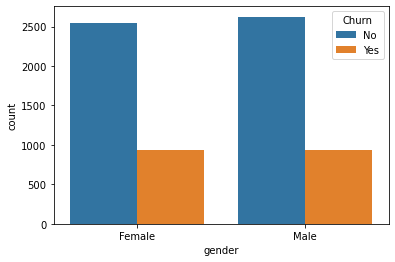

In [20]:
ax=sns.countplot(x="gender", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["gender"].value_counts())

0    5901
1    1142
Name: SeniorCitizen, dtype: int64


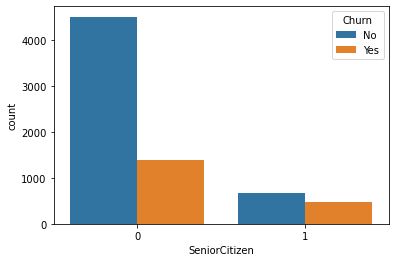

In [21]:
ax=sns.countplot(x="SeniorCitizen", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["SeniorCitizen"].value_counts())

No     3641
Yes    3402
Name: Partner, dtype: int64


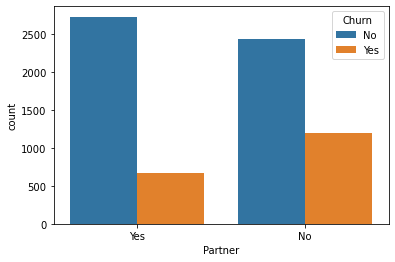

In [22]:
ax=sns.countplot(x="Partner", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["Partner"].value_counts())

No     4933
Yes    2110
Name: Dependents, dtype: int64


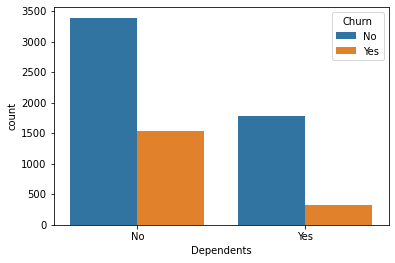

In [23]:
ax=sns.countplot(x="Dependents", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["Dependents"].value_counts())

Yes    6361
No      682
Name: PhoneService, dtype: int64


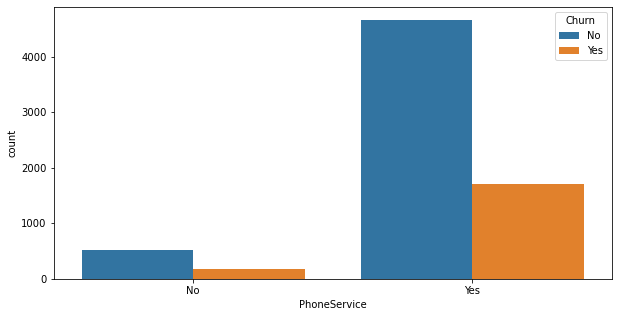

In [24]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="PhoneService", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["PhoneService"].value_counts())

No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64


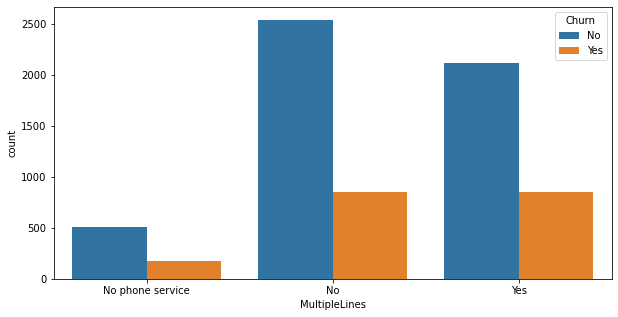

In [25]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="MultipleLines", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["MultipleLines"].value_counts())

Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64


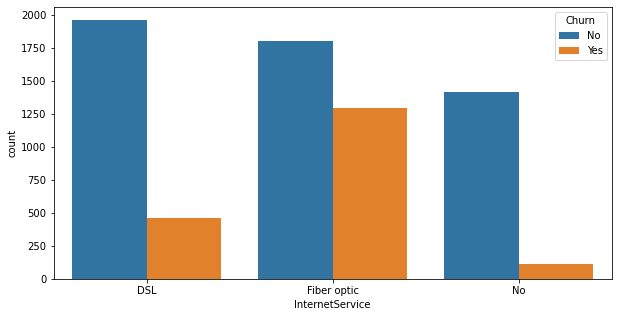

In [26]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="InternetService", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["InternetService"].value_counts())

No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64


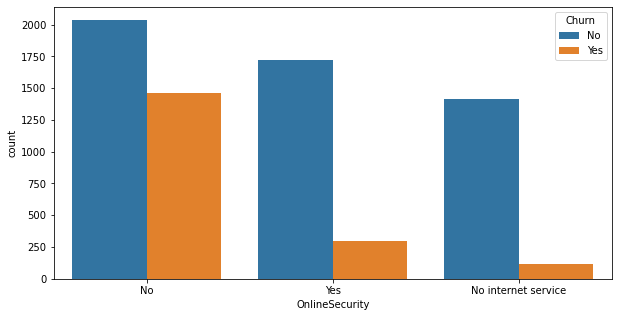

In [27]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="OnlineSecurity", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["OnlineSecurity"].value_counts())

No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64


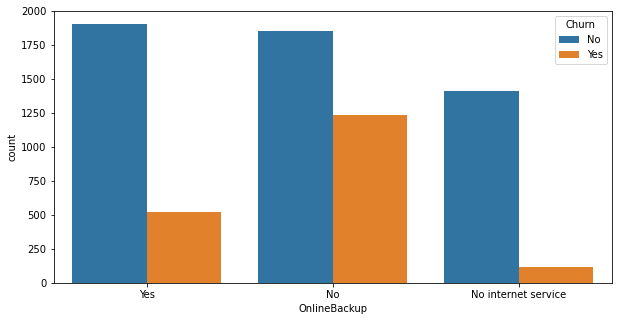

In [28]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="OnlineBackup", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["OnlineBackup"].value_counts())

No                     3095
Yes                    2422
No internet service    1526
Name: DeviceProtection, dtype: int64


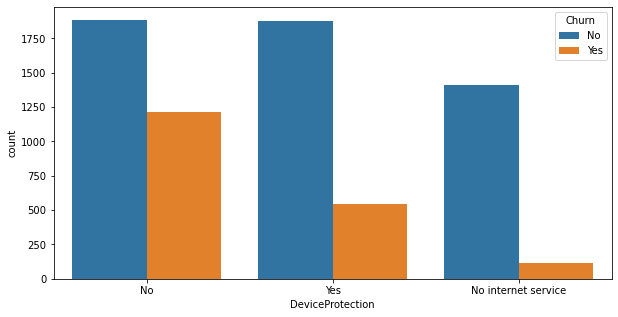

In [29]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="DeviceProtection", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["DeviceProtection"].value_counts())

No                     3473
Yes                    2044
No internet service    1526
Name: TechSupport, dtype: int64


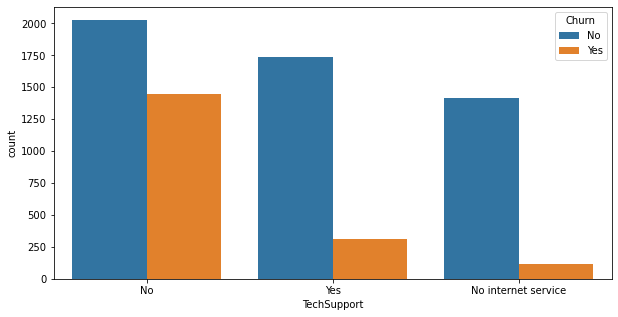

In [30]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="TechSupport", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["TechSupport"].value_counts())

No                     2810
Yes                    2707
No internet service    1526
Name: StreamingTV, dtype: int64


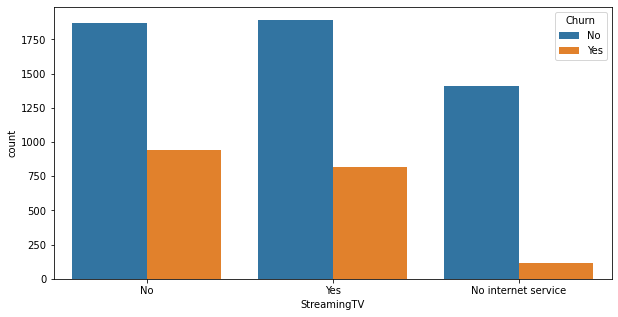

In [31]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="StreamingTV", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["StreamingTV"].value_counts())

No                     2785
Yes                    2732
No internet service    1526
Name: StreamingMovies, dtype: int64


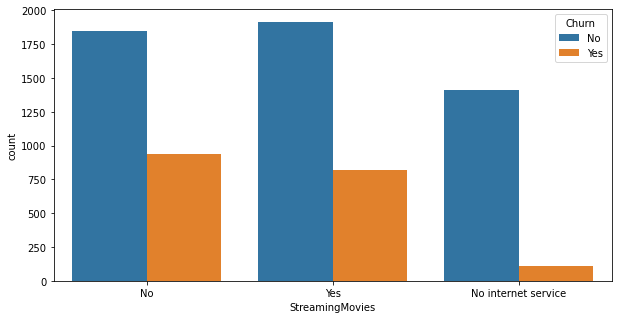

In [32]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="StreamingMovies", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["StreamingMovies"].value_counts())

Month-to-month    3875
Two year          1695
One year          1473
Name: Contract, dtype: int64


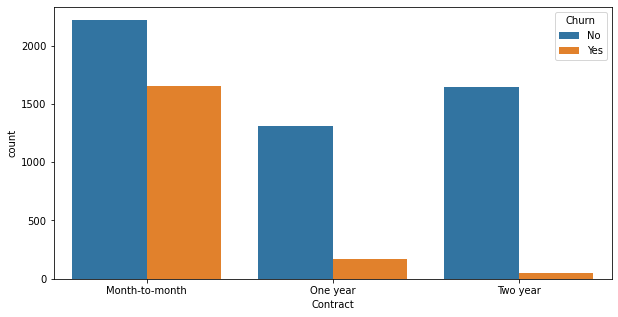

In [33]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="Contract", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["Contract"].value_counts())

Yes    4171
No     2872
Name: PaperlessBilling, dtype: int64


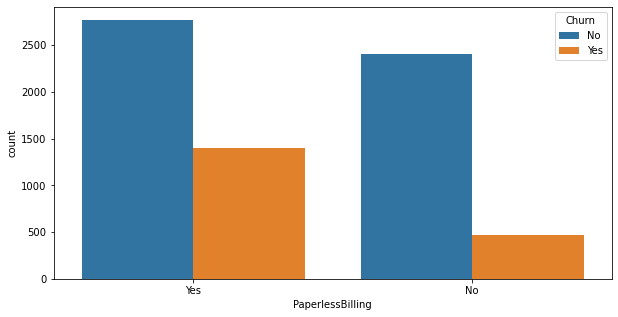

In [34]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="PaperlessBilling", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["PaperlessBilling"].value_counts())

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64


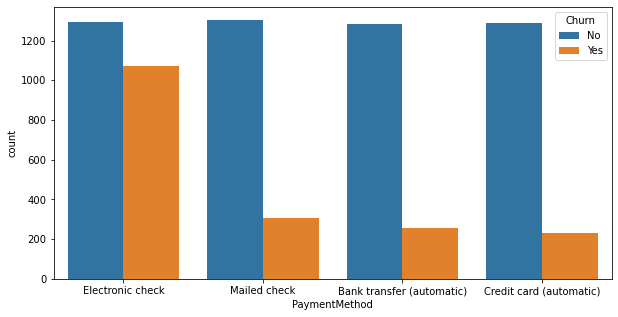

In [35]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="PaymentMethod", data=Customer_Churn_nominal, hue="Churn")
print(Customer_Churn_nominal["PaymentMethod"].value_counts())

No     5174
Yes    1869
Name: Churn, dtype: int64


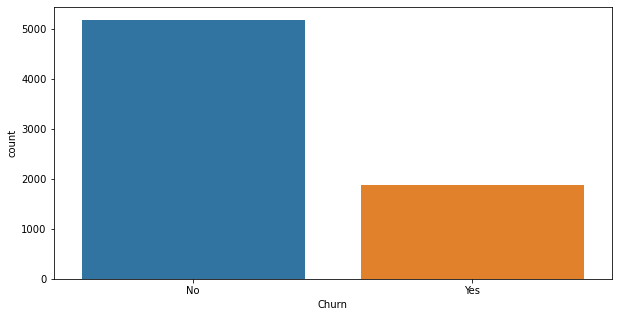

In [36]:
countplt,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="Churn", data=Customer_Churn_nominal,)
print(Customer_Churn_nominal["Churn"].value_counts())

Since it is a class imbalance problem we will use SMOTE technique for balancing the class.

### Label Encoding String Data

In [37]:
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()

In [38]:
for i in Customer_Churn.columns:
    if Customer_Churn[i].dtypes=="object":
        Customer_Churn[i]=enc.fit_transform(Customer_Churn[i].values.reshape(-1,1))

In [39]:
Customer_Churn

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,5375.0,0.0,0,1.0,0.0,1,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,2.0,29.85,29.85,0.0
1,3962.0,1.0,0,0.0,0.0,34,1.0,0.0,0.0,2.0,...,2.0,0.0,0.0,0.0,1.0,0.0,3.0,56.95,1889.50,0.0
2,2564.0,1.0,0,0.0,0.0,2,1.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,3.0,53.85,108.15,1.0
3,5535.0,1.0,0,0.0,0.0,45,0.0,1.0,0.0,2.0,...,2.0,2.0,0.0,0.0,1.0,0.0,0.0,42.30,1840.75,0.0
4,6511.0,0.0,0,0.0,0.0,2,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,2.0,70.70,151.65,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,4853.0,1.0,0,1.0,1.0,24,1.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,1.0,1.0,3.0,84.80,1990.50,0.0
7039,1525.0,0.0,0,1.0,1.0,72,1.0,2.0,1.0,0.0,...,2.0,0.0,2.0,2.0,1.0,1.0,1.0,103.20,7362.90,0.0
7040,3367.0,0.0,0,1.0,1.0,11,0.0,1.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,2.0,29.60,346.45,0.0
7041,5934.0,1.0,1,1.0,0.0,4,1.0,2.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,3.0,74.40,306.60,1.0


### Applying SMOTE for class imbalance


In [40]:
import sklearn
sklearn.__version__

'1.0.1'

In [41]:
import numpy 
numpy.__version__

'1.19.2'

In [42]:
!pip install -U imbalanced-learn

Requirement already up-to-date: imbalanced-learn in c:\users\user\anaconda3\lib\site-packages (0.8.1)


In [43]:
Customer_Churn_y=Customer_Churn.iloc[:,-1]
Customer_Churn_y

0       0.0
1       0.0
2       1.0
3       0.0
4       1.0
       ... 
7038    0.0
7039    0.0
7040    0.0
7041    1.0
7042    0.0
Name: Churn, Length: 7043, dtype: float64

In [44]:
Customer_Churn_x=Customer_Churn.iloc[:,0:-1]
Customer_Churn_x

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,5375.0,0.0,0,1.0,0.0,1,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,29.85,29.85
1,3962.0,1.0,0,0.0,0.0,34,1.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,3.0,56.95,1889.50
2,2564.0,1.0,0,0.0,0.0,2,1.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,53.85,108.15
3,5535.0,1.0,0,0.0,0.0,45,0.0,1.0,0.0,2.0,0.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,42.30,1840.75
4,6511.0,0.0,0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,70.70,151.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,4853.0,1.0,0,1.0,1.0,24,1.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,1.0,1.0,3.0,84.80,1990.50
7039,1525.0,0.0,0,1.0,1.0,72,1.0,2.0,1.0,0.0,2.0,2.0,0.0,2.0,2.0,1.0,1.0,1.0,103.20,7362.90
7040,3367.0,0.0,0,1.0,1.0,11,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,29.60,346.45
7041,5934.0,1.0,1,1.0,0.0,4,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,74.40,306.60


In [45]:
from imblearn.over_sampling import SMOTE

In [46]:
smt=SMOTE()
Customer_Churn_X,Customer_Churn_Y=smt.fit_resample(Customer_Churn_x,Customer_Churn_y)

In [47]:
Customer_Churn_X.value_counts()

customerID   gender    SeniorCitizen  Partner   Dependents  tenure  PhoneService  MultipleLines  InternetService  OnlineSecurity  OnlineBackup  DeviceProtection  TechSupport  StreamingTV  StreamingMovies  Contract  PaperlessBilling  PaymentMethod  MonthlyCharges  TotalCharges
7042.000000  1.000000  0              1.000000  1.0         63      0.000000      1.000000       0.000000         2.000000        2.000000      2.000000          0.000000     2.000000     2.000000         2.0       0.000000          2.000000       59.000000       3707.600000     1
2353.000000  1.000000  1              0.000000  0.0         16      1.000000      2.000000       1.000000         0.000000        0.000000      0.000000          0.000000     2.000000     0.000000         0.0       1.000000          2.000000       86.600000       1281.000000     1
2338.000000  1.000000  0              1.000000  1.0         29      1.000000      2.000000       0.000000         0.000000        2.000000      2.000000       

In [48]:
Customer_Churn_Y.value_counts()

1.0    5174
0.0    5174
Name: Churn, dtype: int64

In [49]:
y=pd.DataFrame(Customer_Churn_Y)
x=pd.DataFrame(Customer_Churn_X)

In [50]:
Customer_Churn = pd.concat([x, y], axis=1,)
Customer_Churn

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,5375.000000,0.000000,0,1.000000,0.000000,1,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,29.850000,29.850000,0.0
1,3962.000000,1.000000,0,0.000000,0.000000,34,1.000000,0.000000,0.000000,2.000000,...,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,3.000000,56.950000,1889.500000,0.0
2,2564.000000,1.000000,0,0.000000,0.000000,2,1.000000,0.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,53.850000,108.150000,1.0
3,5535.000000,1.000000,0,0.000000,0.000000,45,0.000000,1.000000,0.000000,2.000000,...,2.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,42.300000,1840.750000,0.0
4,6511.000000,0.000000,0,0.000000,0.000000,2,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,70.700000,151.650000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,6340.850178,0.336901,0,0.000000,0.000000,2,0.336901,0.663099,0.336901,0.673801,...,0.000000,0.000000,0.000000,0.673801,0.000000,0.336901,2.336901,45.245046,67.558344,1.0
10344,4528.695760,0.429343,0,0.570657,0.000000,34,0.429343,0.570657,0.429343,0.000000,...,1.141313,0.858687,2.000000,2.000000,0.000000,0.429343,1.429343,72.916937,2247.851805,1.0
10345,5225.492361,0.000000,1,0.000000,0.000000,62,1.000000,0.134909,0.067455,2.000000,...,0.134909,1.865091,2.000000,0.134909,1.865091,1.000000,1.067455,73.100547,4495.064282,1.0
10346,2964.732647,0.253471,0,0.746529,0.746529,5,1.000000,0.506941,1.000000,0.000000,...,0.000000,1.493059,1.493059,1.493059,0.000000,1.000000,2.746529,93.003336,466.253986,1.0


### Checking the distribution of the continous value or the float type columns 

In [51]:
Customer_Churn_continuous=Customer_Churn[["customerID","tenure","MonthlyCharges","TotalCharges"]].copy()

In [52]:
Customer_Churn_continuous.columns

Index(['customerID', 'tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

<AxesSubplot:xlabel='customerID', ylabel='Density'>

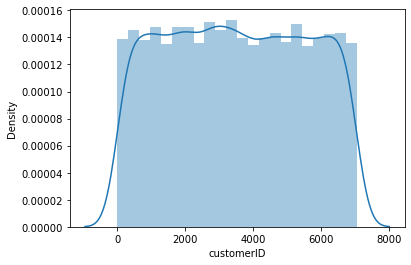

In [53]:
sns.distplot(Customer_Churn_continuous['customerID'],kde=True)

The distribution plot is uniform with minimum value 0 and maximum value 7000.

<AxesSubplot:xlabel='tenure', ylabel='Density'>

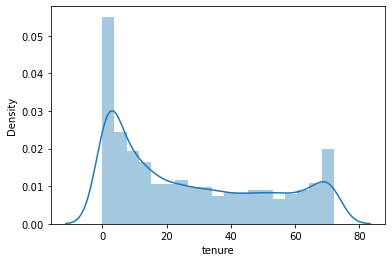

In [54]:
sns.distplot(Customer_Churn_continuous['tenure'],kde=True)

The distribution plot is non-uniform with minimum value 0 and maximum value 70.

<AxesSubplot:xlabel='MonthlyCharges', ylabel='Density'>

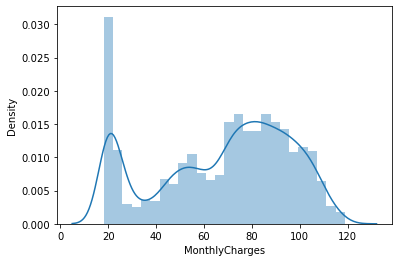

In [55]:
sns.distplot(Customer_Churn_continuous['MonthlyCharges'],kde=True)

The plot is looking left skewed with minimum value 20 and maximum value 120.

<AxesSubplot:xlabel='TotalCharges', ylabel='Density'>

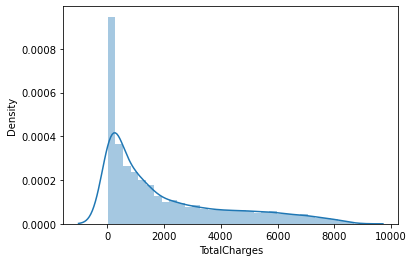

In [56]:
sns.distplot(Customer_Churn_continuous['TotalCharges'],kde=True)

The plot is positively skewed with maximum value 9000 and minimum value 0.

### Outliers Check

In [57]:
Customer_Churn.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

<AxesSubplot:>

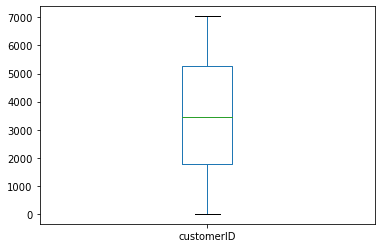

In [58]:
Customer_Churn['customerID'].plot.box()

<AxesSubplot:>

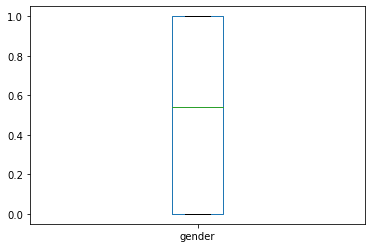

In [59]:
Customer_Churn['gender'].plot.box()

<AxesSubplot:>

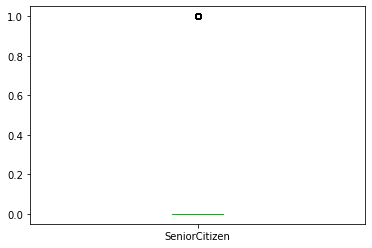

In [60]:
Customer_Churn['SeniorCitizen'].plot.box()

<AxesSubplot:>

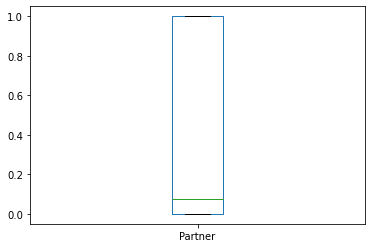

In [61]:
Customer_Churn['Partner'].plot.box()

<AxesSubplot:>

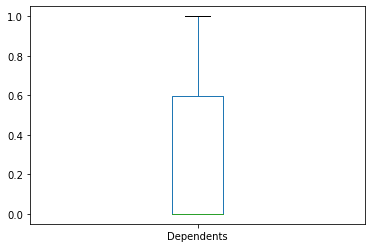

In [62]:
Customer_Churn['Dependents'].plot.box()

<AxesSubplot:>

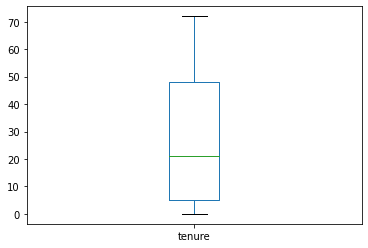

In [63]:
Customer_Churn['tenure'].plot.box()

<AxesSubplot:>

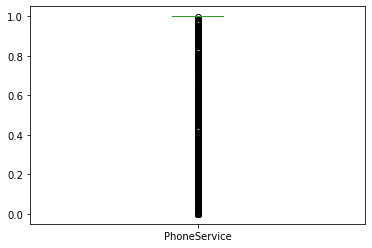

In [64]:
Customer_Churn['PhoneService'].plot.box()

<AxesSubplot:>

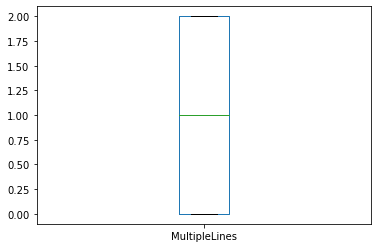

In [65]:
Customer_Churn['MultipleLines'].plot.box()

<AxesSubplot:>

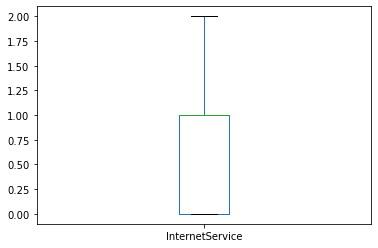

In [66]:
Customer_Churn['InternetService'].plot.box()

<AxesSubplot:>

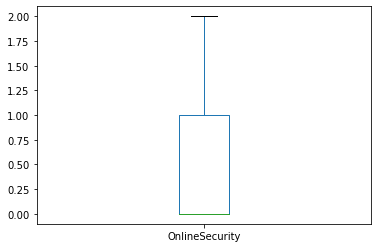

In [67]:
Customer_Churn['OnlineSecurity'].plot.box()

<AxesSubplot:>

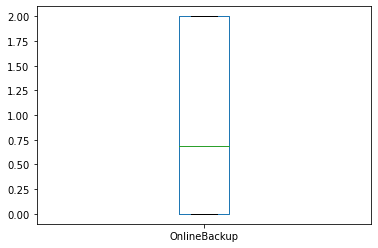

In [68]:
Customer_Churn['OnlineBackup'].plot.box()

<AxesSubplot:>

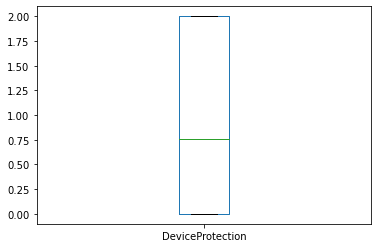

In [69]:
Customer_Churn['DeviceProtection'].plot.box()

<AxesSubplot:>

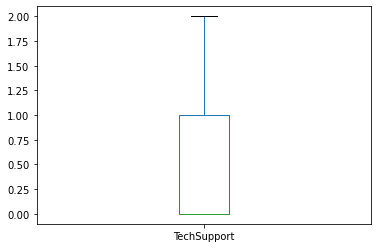

In [70]:
Customer_Churn['TechSupport'].plot.box()

<AxesSubplot:>

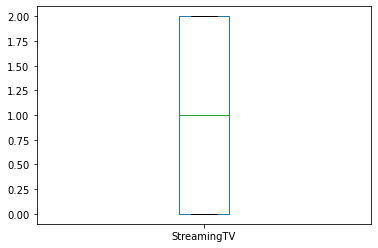

In [71]:
Customer_Churn['StreamingTV'].plot.box()

<AxesSubplot:>

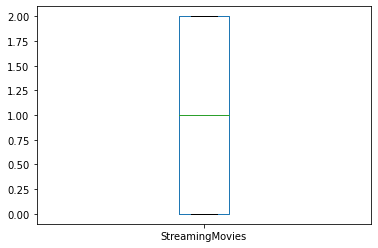

In [72]:
Customer_Churn['StreamingMovies'].plot.box()

<AxesSubplot:>

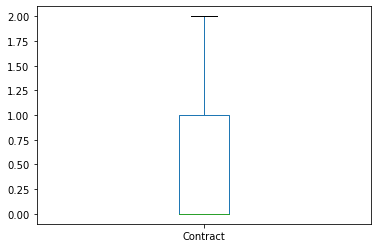

In [73]:
Customer_Churn['Contract'].plot.box()

<AxesSubplot:>

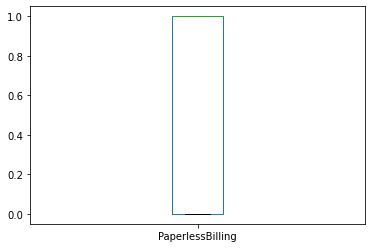

In [74]:
Customer_Churn['PaperlessBilling'].plot.box()

<AxesSubplot:>

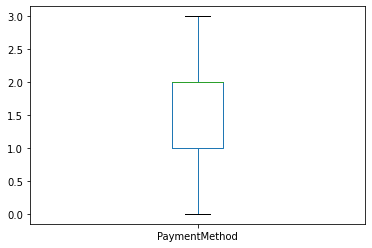

In [75]:
Customer_Churn['PaymentMethod'].plot.box()

<AxesSubplot:>

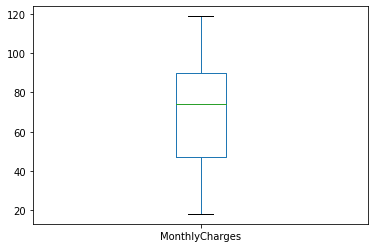

In [76]:
Customer_Churn['MonthlyCharges'].plot.box()

<AxesSubplot:>

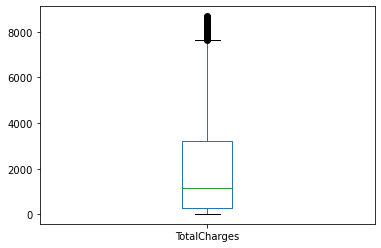

In [77]:
Customer_Churn['TotalCharges'].plot.box()

<AxesSubplot:>

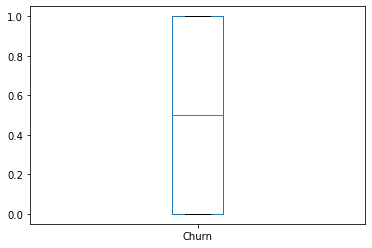

In [78]:
Customer_Churn['Churn'].plot.box()

From the above outliers plots we can say that SeniorCitizen, PhoneService, TotalCharges

## Bivariate Analysis 

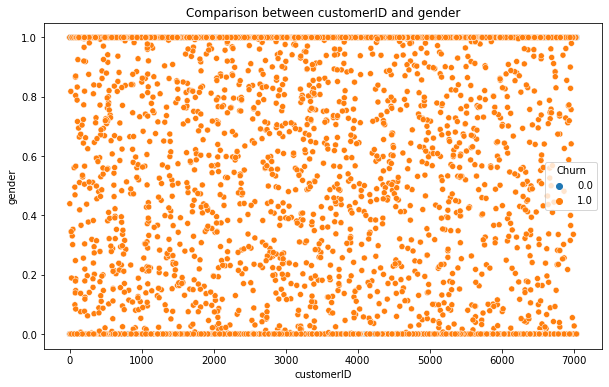

In [79]:
plt.figure(figsize=[10,6])
plt.title('Comparison between customerID and gender')
sns.scatterplot(Customer_Churn['customerID'], Customer_Churn["gender"], hue=Customer_Churn["Churn"]);

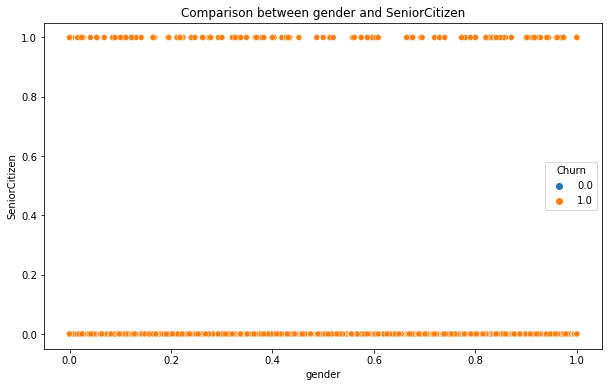

In [80]:
plt.figure(figsize=[10,6])
plt.title('Comparison between gender and SeniorCitizen')
sns.scatterplot(Customer_Churn['gender'], Customer_Churn["SeniorCitizen"], hue=Customer_Churn["Churn"]);

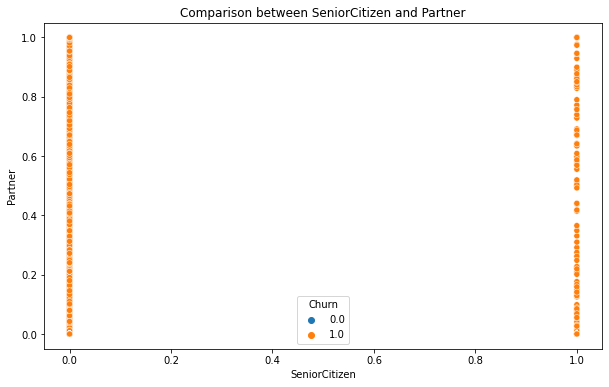

In [81]:
plt.figure(figsize=[10,6])
plt.title('Comparison between SeniorCitizen and Partner')
sns.scatterplot(Customer_Churn['SeniorCitizen'], Customer_Churn["Partner"], hue=Customer_Churn["Churn"]);

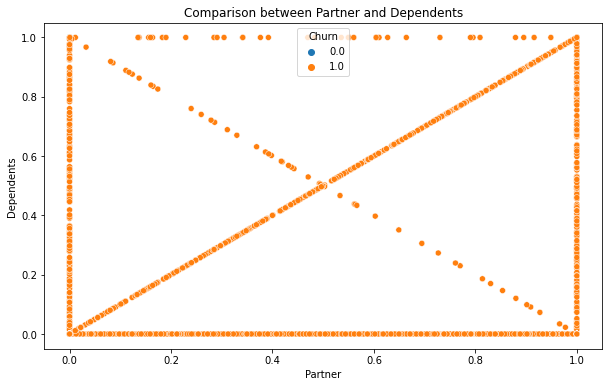

In [82]:
plt.figure(figsize=[10,6])
plt.title('Comparison between Partner and Dependents')
sns.scatterplot(Customer_Churn['Partner'], Customer_Churn["Dependents"], hue=Customer_Churn["Churn"]);

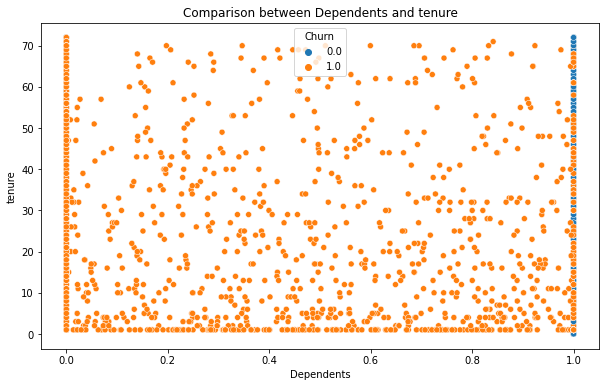

In [83]:
plt.figure(figsize=[10,6])
plt.title('Comparison between Dependents and tenure')
sns.scatterplot(Customer_Churn['Dependents'], Customer_Churn["tenure"], hue=Customer_Churn["Churn"]);

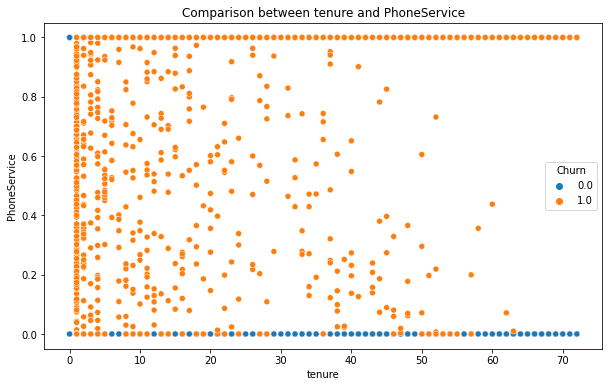

In [84]:
plt.figure(figsize=[10,6])
plt.title('Comparison between tenure and PhoneService')
sns.scatterplot(Customer_Churn['tenure'], Customer_Churn["PhoneService"], hue=Customer_Churn["Churn"]);

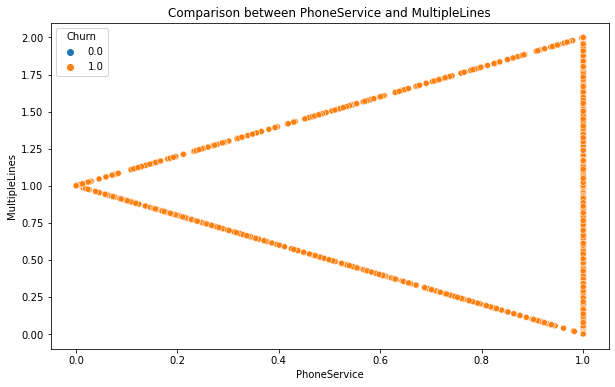

In [85]:
plt.figure(figsize=[10,6])
plt.title('Comparison between PhoneService and MultipleLines')
sns.scatterplot(Customer_Churn['PhoneService'], Customer_Churn["MultipleLines"], hue=Customer_Churn["Churn"]);

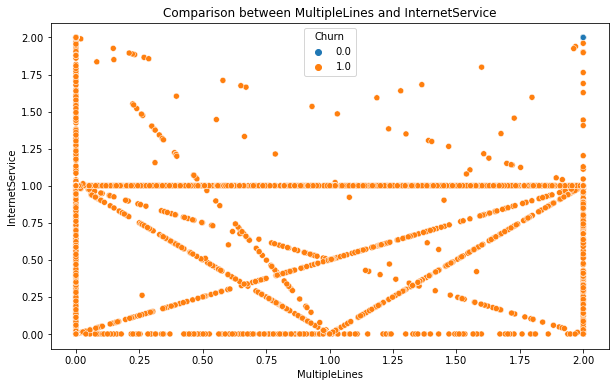

In [86]:
plt.figure(figsize=[10,6])
plt.title('Comparison between MultipleLines and InternetService')
sns.scatterplot(Customer_Churn['MultipleLines'], Customer_Churn["InternetService"], hue=Customer_Churn["Churn"]);

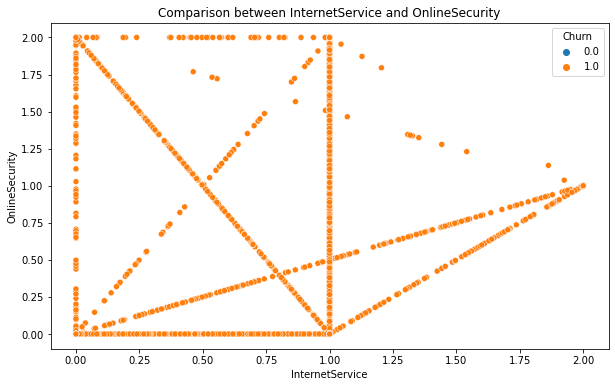

In [87]:
plt.figure(figsize=[10,6])
plt.title('Comparison between InternetService and OnlineSecurity')
sns.scatterplot(Customer_Churn['InternetService'], Customer_Churn["OnlineSecurity"], hue=Customer_Churn["Churn"]);

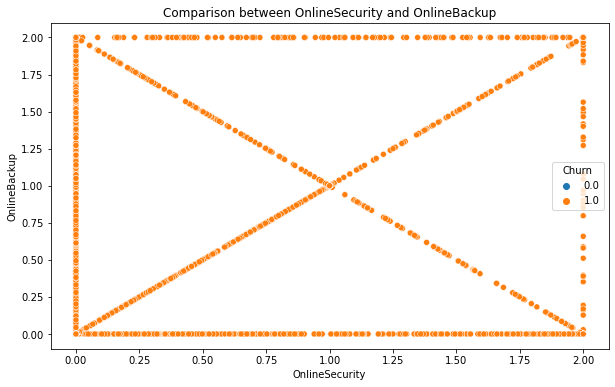

In [88]:
plt.figure(figsize=[10,6])
plt.title('Comparison between OnlineSecurity and OnlineBackup')
sns.scatterplot(Customer_Churn['OnlineSecurity'], Customer_Churn["OnlineBackup"], hue=Customer_Churn["Churn"]);

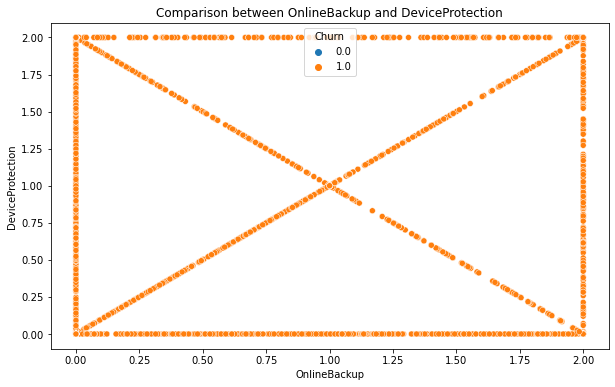

In [89]:
plt.figure(figsize=[10,6])
plt.title('Comparison between OnlineBackup and DeviceProtection')
sns.scatterplot(Customer_Churn['OnlineBackup'], Customer_Churn["DeviceProtection"], hue=Customer_Churn["Churn"]);

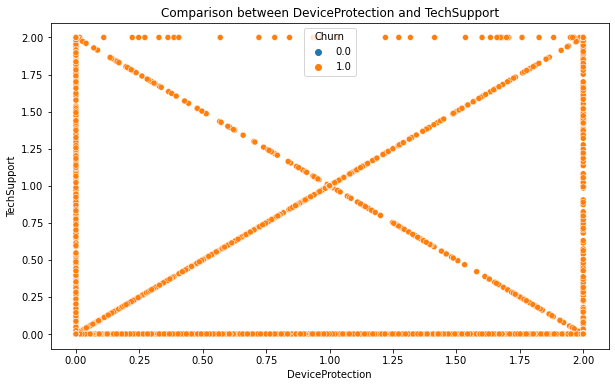

In [90]:
plt.figure(figsize=[10,6])
plt.title('Comparison between DeviceProtection and TechSupport')
sns.scatterplot(Customer_Churn['DeviceProtection'], Customer_Churn["TechSupport"], hue=Customer_Churn["Churn"]);

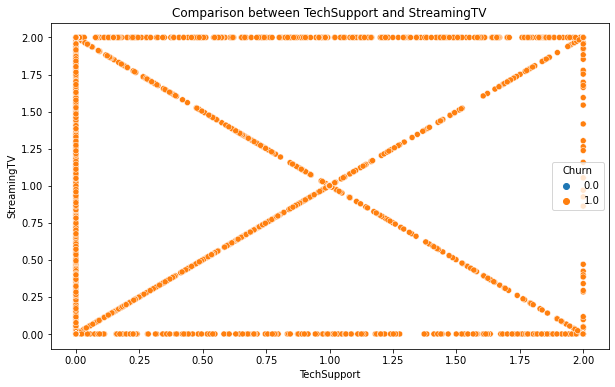

In [91]:

plt.figure(figsize=[10,6])
plt.title('Comparison between TechSupport and StreamingTV')
sns.scatterplot(Customer_Churn['TechSupport'], Customer_Churn["StreamingTV"], hue=Customer_Churn["Churn"]);

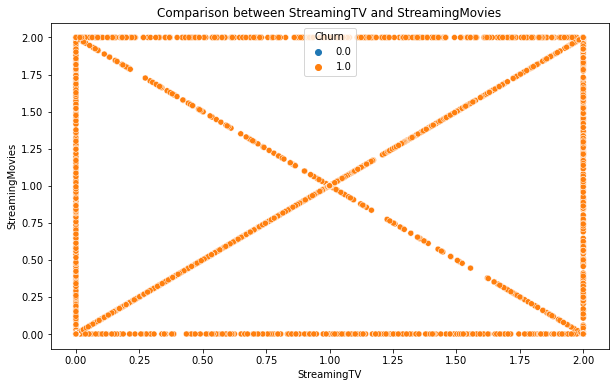

In [92]:
plt.figure(figsize=[10,6])
plt.title('Comparison between StreamingTV and StreamingMovies')
sns.scatterplot(Customer_Churn['StreamingTV'], Customer_Churn["StreamingMovies"], hue=Customer_Churn["Churn"]);

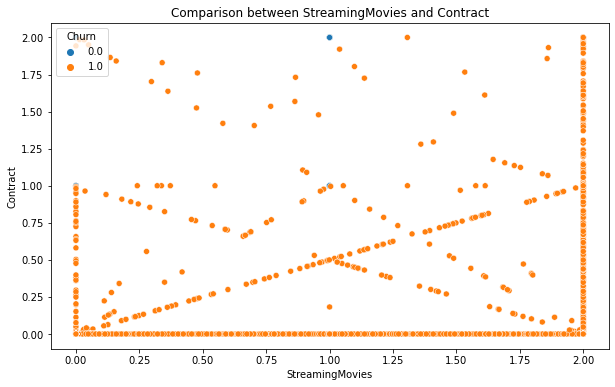

In [93]:
plt.figure(figsize=[10,6])
plt.title('Comparison between StreamingMovies and Contract')
sns.scatterplot(Customer_Churn['StreamingMovies'], Customer_Churn["Contract"], hue=Customer_Churn["Churn"]);

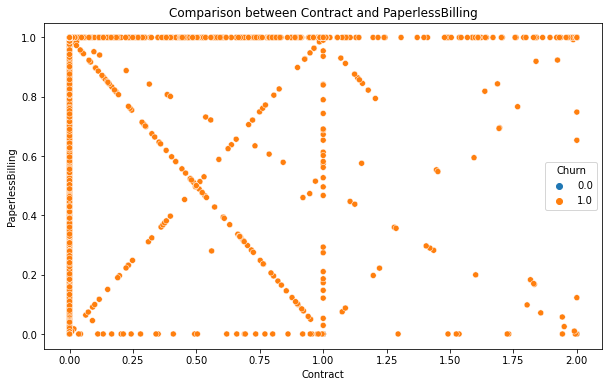

In [94]:
plt.figure(figsize=[10,6])
plt.title('Comparison between Contract and PaperlessBilling')
sns.scatterplot(Customer_Churn['Contract'], Customer_Churn["PaperlessBilling"], hue=Customer_Churn["Churn"]);

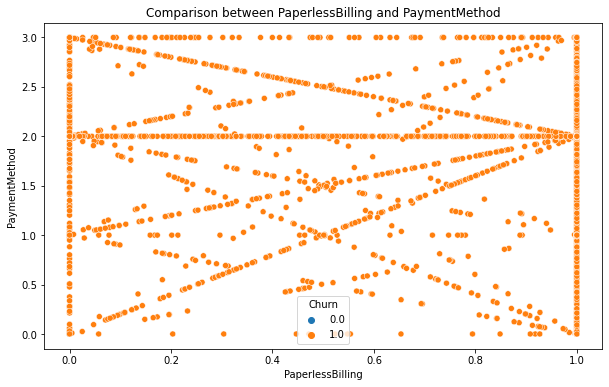

In [95]:
plt.figure(figsize=[10,6])
plt.title('Comparison between PaperlessBilling and PaymentMethod')
sns.scatterplot(Customer_Churn['PaperlessBilling'], Customer_Churn["PaymentMethod"], hue=Customer_Churn["Churn"]);

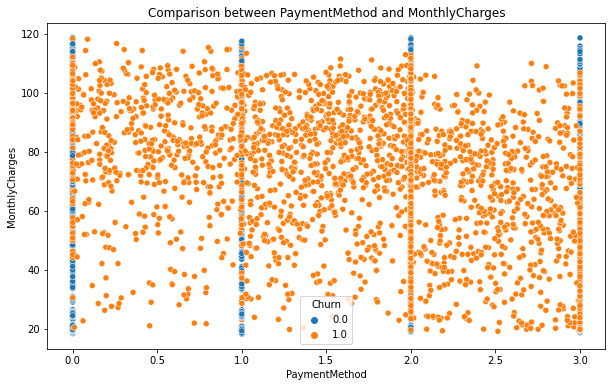

In [96]:
plt.figure(figsize=[10,6])
plt.title('Comparison between PaymentMethod and MonthlyCharges')
sns.scatterplot(Customer_Churn['PaymentMethod'], Customer_Churn["MonthlyCharges"], hue=Customer_Churn["Churn"]);

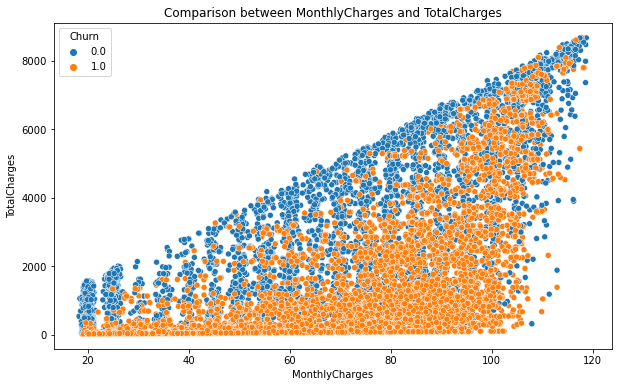

In [97]:
plt.figure(figsize=[10,6])
plt.title('Comparison between MonthlyCharges and TotalCharges')
sns.scatterplot(Customer_Churn['MonthlyCharges'], Customer_Churn["TotalCharges"], hue=Customer_Churn["Churn"]);

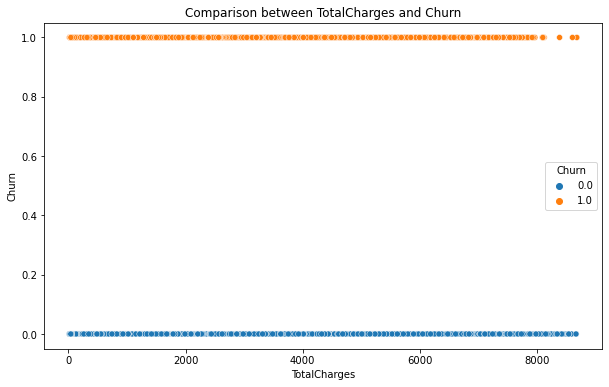

In [98]:
plt.figure(figsize=[10,6])
plt.title('Comparison between TotalCharges and Churn')
sns.scatterplot(Customer_Churn['TotalCharges'], Customer_Churn["Churn"], hue=Customer_Churn["Churn"]);

From the bivariate analysis we can say that some correlation can be found in TotalCharges and MonthlyCharges.

In [99]:
Customer_Churn.describe(percentiles=[0.20,0.25,0.40,0.50,0.60,0.75,0.80])

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
count,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,...,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000,10348.000000
mean,3504.508184,0.505175,0.132683,0.444200,0.258676,27.538558,0.904651,0.961436,0.848745,0.650251,...,0.821068,0.661691,0.955174,0.974630,0.513923,0.645829,1.632947,67.840466,2028.375533,0.500000
std,2025.486093,0.473171,0.339248,0.474477,0.420900,24.000639,0.279504,0.910039,0.654476,0.812622,...,0.851348,0.816333,0.866808,0.868349,0.763698,0.457478,0.981362,28.073932,2177.428686,0.500024
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.250000,18.800000,0.000000
20%,1408.400000,0.000000,0.000000,0.000000,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.972343,38.452790,181.556031,0.000000
25%,1761.228901,0.000000,0.000000,0.000000,0.000000,5.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,47.233145,273.192637,0.000000
40%,2802.895785,0.000000,0.000000,0.000000,0.000000,13.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.356892,0.476292,0.000000,0.892088,1.631125,65.476788,732.900655,0.000000
50%,3464.200921,0.538651,0.000000,0.076720,0.000000,21.000000,1.000000,1.000000,1.000000,0.000000,...,0.761314,0.000000,1.000000,1.000000,0.000000,1.000000,2.000000,74.200000,1139.074403,0.500000
60%,4190.416453,1.000000,0.000000,0.833684,0.000000,31.000000,1.000000,1.624489,1.000000,0.896152,...,1.000000,1.000000,1.000000,1.131827,0.000000,1.000000,2.000000,80.250000,1709.110000,1.000000
75%,5258.466629,1.000000,0.000000,1.000000,0.598705,48.000000,1.000000,2.000000,1.000000,1.000000,...,2.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000,90.100000,3227.736332,1.000000


Mean is higher than median in SeniorCitizen,Partner,Dependents,tenure,PhoneService,OnlineSecurity,DeviceProtection,TechSupport,Contract,TotalCharges 
so the data is positively skewed in these columns.

Small gap can be found between 75 percentile and max in customerID,tenure,InternetService,OnlineSecurity,TechSupport,Contract,PaymentMethod,MonthlyCharges,TotalCharges,
so some outliers are present in these columns.

## multivariate analysis

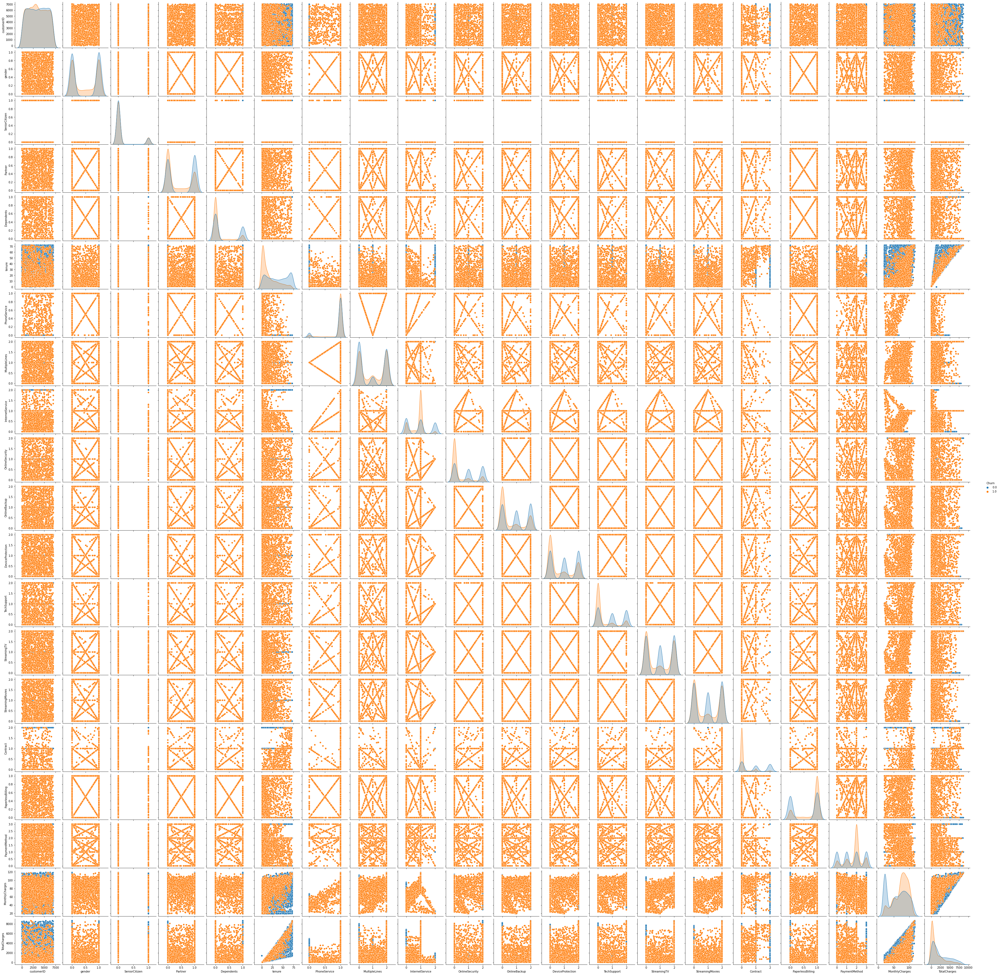

In [100]:
sns.pairplot(Customer_Churn,hue="Churn")  

In [101]:
cor=Customer_Churn.corr()
cor

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,1.000000,-0.004783,0.003139,-0.030996,-0.018308,-0.000842,-0.009429,0.024569,-0.012798,0.010237,...,-0.012781,-0.013496,0.005939,-0.012971,0.007860,0.012427,0.015303,0.001932,-0.006290,-0.018669
gender,-0.004783,1.000000,0.001510,0.013879,0.009307,0.019190,-0.011552,0.011575,-0.005393,-0.025615,...,0.005478,-0.004630,0.004626,0.007556,0.006660,-0.006677,0.010927,-0.006709,0.018660,-0.004584
SeniorCitizen,0.003139,0.001510,1.000000,0.034548,-0.173951,0.062549,0.009466,0.131148,-0.012852,-0.079271,...,0.005242,-0.102561,0.041099,0.051123,-0.075613,0.117580,-0.044144,0.173667,0.113961,0.011680
Partner,-0.030996,0.013879,0.034548,1.000000,0.448787,0.396929,0.012598,0.147681,0.020635,0.163360,...,0.183417,0.141935,0.153629,0.148041,0.303749,-0.024354,-0.172160,0.099984,0.343742,-0.177084
Dependents,-0.018308,0.009307,-0.173951,0.448787,1.000000,0.182151,0.007357,-0.031654,0.048399,0.167790,...,0.096878,0.154701,0.054011,0.030425,0.263233,-0.123731,-0.058967,-0.110164,0.091270,-0.204630
tenure,-0.000842,0.019190,0.062549,0.396929,0.182151,1.000000,0.018371,0.337798,0.005279,0.359082,...,0.400173,0.358857,0.315455,0.320679,0.686716,-0.024214,-0.376043,0.232565,0.857792,-0.417984
PhoneService,-0.009429,-0.011552,0.009466,0.012598,0.007357,0.018371,1.000000,-0.009883,0.401945,-0.016368,...,0.005937,-0.015548,0.059059,0.040154,0.004406,0.026750,-0.014451,0.296934,0.121413,0.012906
MultipleLines,0.024569,0.011575,0.131148,0.147681,-0.031654,0.337798,-0.009883,1.000000,-0.073614,-0.001321,...,0.137009,0.005920,0.197306,0.212703,0.099967,0.173216,-0.175237,0.441845,0.442006,0.046826
InternetService,-0.012798,-0.005393,-0.012852,0.020635,0.048399,0.005279,0.401945,-0.073614,1.000000,-0.006354,...,0.066538,-0.005362,0.130202,0.115100,0.101691,-0.119887,0.063112,-0.228125,-0.105266,-0.068986
OnlineSecurity,0.010237,-0.025615,-0.079271,0.163360,0.167790,0.359082,-0.016368,-0.001321,-0.006354,1.000000,...,0.194980,0.312593,0.059427,0.057533,0.409435,-0.184413,-0.109192,-0.087368,0.276579,-0.355969


<AxesSubplot:>

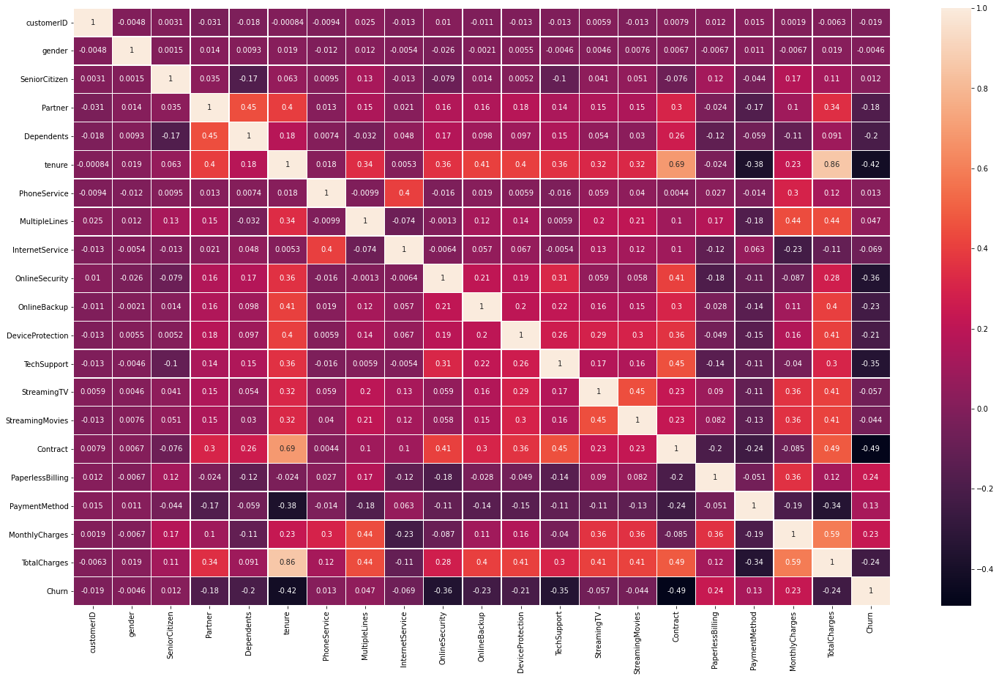

In [102]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(25,15))         # Sample figsize in inches
sns.heatmap(cor, annot=True, linewidths=.5, ax=ax)

From the Correaltion heatmap we can see that:

Columns having positive correlation are:

tenure and TotalCharges with value=0.86

tenure and Contract with value=0.69



## Considering the outlier removal

In [103]:
from scipy.stats import zscore
z=np.abs(zscore(Customer_Churn))
Customer_Churn_new=Customer_Churn[(z<3).all(axis=1)]
Customer_Churn_new

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
1,3962.000000,1.000000,0,0.000000,0.000000,34,1.000000,0.000000,0.000000,2.000000,...,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,3.000000,56.950000,1889.500000,0.0
2,2564.000000,1.000000,0,0.000000,0.000000,2,1.000000,0.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,53.850000,108.150000,1.0
4,6511.000000,0.000000,0,0.000000,0.000000,2,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,70.700000,151.650000,1.0
5,6551.000000,0.000000,0,0.000000,0.000000,8,1.000000,2.000000,1.000000,0.000000,...,2.000000,0.000000,2.000000,2.000000,0.000000,1.000000,2.000000,99.650000,820.500000,1.0
6,1002.000000,1.000000,0,0.000000,1.000000,22,1.000000,2.000000,1.000000,0.000000,...,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,89.100000,1949.400000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,6340.850178,0.336901,0,0.000000,0.000000,2,0.336901,0.663099,0.336901,0.673801,...,0.000000,0.000000,0.000000,0.673801,0.000000,0.336901,2.336901,45.245046,67.558344,1.0
10344,4528.695760,0.429343,0,0.570657,0.000000,34,0.429343,0.570657,0.429343,0.000000,...,1.141313,0.858687,2.000000,2.000000,0.000000,0.429343,1.429343,72.916937,2247.851805,1.0
10345,5225.492361,0.000000,1,0.000000,0.000000,62,1.000000,0.134909,0.067455,2.000000,...,0.134909,1.865091,2.000000,0.134909,1.865091,1.000000,1.067455,73.100547,4495.064282,1.0
10346,2964.732647,0.253471,0,0.746529,0.746529,5,1.000000,0.506941,1.000000,0.000000,...,0.000000,1.493059,1.493059,1.493059,0.000000,1.000000,2.746529,93.003336,466.253986,1.0


In [104]:
Customer_Churn

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,5375.000000,0.000000,0,1.000000,0.000000,1,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,29.850000,29.850000,0.0
1,3962.000000,1.000000,0,0.000000,0.000000,34,1.000000,0.000000,0.000000,2.000000,...,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,3.000000,56.950000,1889.500000,0.0
2,2564.000000,1.000000,0,0.000000,0.000000,2,1.000000,0.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,53.850000,108.150000,1.0
3,5535.000000,1.000000,0,0.000000,0.000000,45,0.000000,1.000000,0.000000,2.000000,...,2.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,42.300000,1840.750000,0.0
4,6511.000000,0.000000,0,0.000000,0.000000,2,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,70.700000,151.650000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10343,6340.850178,0.336901,0,0.000000,0.000000,2,0.336901,0.663099,0.336901,0.673801,...,0.000000,0.000000,0.000000,0.673801,0.000000,0.336901,2.336901,45.245046,67.558344,1.0
10344,4528.695760,0.429343,0,0.570657,0.000000,34,0.429343,0.570657,0.429343,0.000000,...,1.141313,0.858687,2.000000,2.000000,0.000000,0.429343,1.429343,72.916937,2247.851805,1.0
10345,5225.492361,0.000000,1,0.000000,0.000000,62,1.000000,0.134909,0.067455,2.000000,...,0.134909,1.865091,2.000000,0.134909,1.865091,1.000000,1.067455,73.100547,4495.064282,1.0
10346,2964.732647,0.253471,0,0.746529,0.746529,5,1.000000,0.506941,1.000000,0.000000,...,0.000000,1.493059,1.493059,1.493059,0.000000,1.000000,2.746529,93.003336,466.253986,1.0


In [105]:
10348-9586

762

In [106]:
762/10348

0.07363741785852339

Here after the outlier removal data loss is greater than 5 percent so we will use the original dataset. 

### Skewness Checking and Removal

In [107]:
Customer_Churn.skew()

customerID          0.015429
gender             -0.021487
SeniorCitizen       2.165900
Partner             0.222384
Dependents          1.098843
tenure              0.515832
PhoneService       -2.738803
MultipleLines       0.078549
InternetService     0.243645
OnlineSecurity      0.731694
OnlineBackup        0.380859
DeviceProtection    0.358384
TechSupport         0.704779
StreamingTV         0.091704
StreamingMovies     0.054069
Contract            1.092313
PaperlessBilling   -0.608434
PaymentMethod      -0.307463
MonthlyCharges     -0.400474
TotalCharges        1.134471
Churn               0.000000
dtype: float64

From the skewness table:
Columns having positive skewness are:

SeniorCitizen with value=2.190890

Dependents with value=1.091246

tenure with value=0.514831

OnlineSecurity with value=0.718351

TechSupport with value=0.692289

Contract with value=1.097111

TotalCharges with value=1.130017

Columns having negative skewness are:

PhoneService with value=-2.783234

PaperlessBilling with value=-0.602445




In [108]:
xnew=Customer_Churn.iloc[:,0:-1]
ynew=Customer_Churn.iloc[:,-1]

In [109]:
from sklearn.preprocessing import power_transform
x_new=power_transform(xnew, method='yeo-johnson')
x_new

array([[ 0.91193826, -1.08171821, -0.39112722, ...,  0.35112555,
        -1.34461772, -1.74973912],
       [ 0.30947701,  1.03176746, -0.39112722, ...,  1.4364771 ,
        -0.43810305,  0.41374567],
       [-0.35437229,  1.03176746, -0.39112722, ...,  1.4364771 ,
        -0.54715119, -1.25912524],
       ...,
       [ 0.85063675, -1.08171821,  2.55671288, ..., -0.60858917,
         0.14796575,  1.13613409],
       [-0.15502171, -0.43404008, -0.39112722, ...,  1.15664765,
         0.90589498, -0.52213258],
       [ 0.85525357,  0.68932741, -0.39112722, ...,  0.56180043,
        -0.99100057, -1.64234171]])

In [110]:
from sklearn.preprocessing import StandardScaler
SC=StandardScaler()
x_scaled=SC.fit_transform(x_new)
x_scaled

array([[ 0.91193826, -1.08171821, -0.39112722, ...,  0.35112555,
        -1.34461772, -1.74973912],
       [ 0.30947701,  1.03176746, -0.39112722, ...,  1.4364771 ,
        -0.43810305,  0.41374567],
       [-0.35437229,  1.03176746, -0.39112722, ...,  1.4364771 ,
        -0.54715119, -1.25912524],
       ...,
       [ 0.85063675, -1.08171821,  2.55671288, ..., -0.60858917,
         0.14796575,  1.13613409],
       [-0.15502171, -0.43404008, -0.39112722, ...,  1.15664765,
         0.90589498, -0.52213258],
       [ 0.85525357,  0.68932741, -0.39112722, ...,  0.56180043,
        -0.99100057, -1.64234171]])

In [111]:
xtrain=x_scaled
ytrain=ynew

## train_test_split

In [112]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

for i in range(200):
    x_train, x_test, y_train, y_test=train_test_split(xtrain,ytrain,test_size=0.33, random_state=i)
    from sklearn.tree import DecisionTreeClassifier
    lm=DecisionTreeClassifier()
    lm.fit(x_train,y_train)
    pred=lm.predict(x_test)
    accu=accuracy_score(y_test,pred)
    print("accuracy score is",accu*100, "at random_state", i)

accuracy score is 80.96632503660322 at random_state 0
accuracy score is 80.49780380673499 at random_state 1
accuracy score is 82.60614934114201 at random_state 2
accuracy score is 80.52708638360176 at random_state 3
accuracy score is 81.78623718887262 at random_state 4
accuracy score is 80.0 at random_state 5
accuracy score is 81.43484626647145 at random_state 6
accuracy score is 81.17130307467058 at random_state 7
accuracy score is 81.7276720351391 at random_state 8
accuracy score is 81.31771595900439 at random_state 9
accuracy score is 81.1420204978038 at random_state 10
accuracy score is 80.20497803806735 at random_state 11
accuracy score is 81.31771595900439 at random_state 12
accuracy score is 79.53147877013177 at random_state 13
accuracy score is 81.8740849194729 at random_state 14
accuracy score is 81.43484626647145 at random_state 15
accuracy score is 81.61054172767204 at random_state 16
accuracy score is 80.67349926793558 at random_state 17
accuracy score is 80.23426061493412 

In [113]:
from sklearn.tree import DecisionTreeClassifier
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train, x_test, y_train, y_test=train_test_split(xtrain,ytrain,test_size=0.33, random_state=i)
    mod=DecisionTreeClassifier()
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ", maxAccu, "on Random_state", maxRS)

Best accuracy is  0.8275256222547585 on Random_state 70


In [114]:
x_train, x_test, y_train, y_test=train_test_split(xtrain,ytrain,test_size=0.33, random_state=74)


#### Now we are checking accuracy using various algorithm.

In [115]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

In [116]:
# Import Support vector classifier
from sklearn.svm import SVC
SV = SVC()
SV.fit(x_train, y_train)
predsv = SV.predict(x_test)
print(accuracy_score(y_test,predsv))
print(confusion_matrix(y_test,predsv))
print(classification_report(y_test, predsv))

0.8474377745241581
[[1481  237]
 [ 284 1413]]
              precision    recall  f1-score   support

         0.0       0.84      0.86      0.85      1718
         1.0       0.86      0.83      0.84      1697

    accuracy                           0.85      3415
   macro avg       0.85      0.85      0.85      3415
weighted avg       0.85      0.85      0.85      3415



In [117]:
rf=RandomForestClassifier(n_estimators=100,random_state=1)
#RandomForestClassifier(100)----> Default
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
print(accuracy_score(y_test,predrf))
print(confusion_matrix(y_test,predrf))
print(classification_report(y_test,predrf))

0.8667642752562226
[[1550  168]
 [ 287 1410]]
              precision    recall  f1-score   support

         0.0       0.84      0.90      0.87      1718
         1.0       0.89      0.83      0.86      1697

    accuracy                           0.87      3415
   macro avg       0.87      0.87      0.87      3415
weighted avg       0.87      0.87      0.87      3415



In [118]:
#AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=50,learning_rate=1.0)
ad=AdaBoostClassifier()
ad.fit(x_train,y_train)
ad_pred=ad.predict(x_test)
print(accuracy_score(y_test,ad_pred))
print(confusion_matrix(y_test,ad_pred))
print(classification_report(y_test,ad_pred))

0.8638360175695461
[[1490  228]
 [ 237 1460]]
              precision    recall  f1-score   support

         0.0       0.86      0.87      0.87      1718
         1.0       0.86      0.86      0.86      1697

    accuracy                           0.86      3415
   macro avg       0.86      0.86      0.86      3415
weighted avg       0.86      0.86      0.86      3415



In [119]:
from sklearn.ensemble import GradientBoostingClassifier
gb=GradientBoostingClassifier()
gb.fit(x_train,y_train)
gb_pred=gb.predict(x_test)
print(accuracy_score(y_test,gb_pred))
print(confusion_matrix(y_test,gb_pred))
print(classification_report(y_test,gb_pred))

0.8650073206442167
[[1518  200]
 [ 261 1436]]
              precision    recall  f1-score   support

         0.0       0.85      0.88      0.87      1718
         1.0       0.88      0.85      0.86      1697

    accuracy                           0.87      3415
   macro avg       0.87      0.86      0.86      3415
weighted avg       0.87      0.87      0.86      3415



In [120]:
#k=5
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train,y_train)
knn.score(x_train,y_train)
predknn=knn.predict(x_test)
print(accuracy_score(y_test,predknn))
print(confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn))

0.7797950219619326
[[1155  563]
 [ 189 1508]]
              precision    recall  f1-score   support

         0.0       0.86      0.67      0.75      1718
         1.0       0.73      0.89      0.80      1697

    accuracy                           0.78      3415
   macro avg       0.79      0.78      0.78      3415
weighted avg       0.79      0.78      0.78      3415



## Cross-Validation-Score

In [121]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(SV,xtrain,ytrain,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.72608696 0.75603865 0.86425121 0.89463509 0.88641856]
0.8254860921400102
0.07028544566712419


In [122]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(rf,xtrain,ytrain,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.67101449 0.73719807 0.92125604 0.93426776 0.93958434]
0.840664140299755
0.11360293057739815


In [123]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(ad,xtrain,ytrain,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.70724638 0.75652174 0.89565217 0.90671822 0.90575157]
0.8343780164050406
0.08521251738616976


In [124]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(gb,xtrain,ytrain,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.68502415 0.74927536 0.90869565 0.92025133 0.92653456]
0.8379562111968021
0.10087138873147358


In [125]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(knn,xtrain,ytrain,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.74444444 0.752657   0.80434783 0.81343644 0.80666989]
0.784311121384692
0.029465245240862366


From the above cv scores we can say that RnadomForestClassifier is showing the best result.

### Hyper parameter tuning

In [126]:
from sklearn.model_selection import RandomizedSearchCV

In [127]:
parameter = {'n_estimators':np.arange(1,9),
            'min_samples_split':np.arange(2,10), 
            'min_samples_leaf':np.arange(1,7),
            'max_leaf_nodes' :np.arange(3,7)}

In [128]:
RCV=RandomizedSearchCV(RandomForestClassifier(),parameter,cv=5)

In [129]:
RCV.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'max_leaf_nodes': array([3, 4, 5, 6]),
                                        'min_samples_leaf': array([1, 2, 3, 4, 5, 6]),
                                        'min_samples_split': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'n_estimators': array([1, 2, 3, 4, 5, 6, 7, 8])})

In [130]:
RCV.best_params_

{'n_estimators': 5,
 'min_samples_split': 3,
 'min_samples_leaf': 6,
 'max_leaf_nodes': 6}

In [131]:
Final_model= RandomForestClassifier(n_estimators = 8, min_samples_split = 7, min_samples_leaf = 4, max_leaf_nodes = 5)
Final_model.fit(x_train, y_train)
pred = Final_model.predict(x_test)
acc=accuracy_score(y_test, pred)
print(acc*100)

79.94143484626647


## AUC-ROC Curve

In [132]:
from sklearn.metrics import roc_curve, auc
fpr,tpr,thresholds=roc_curve(pred,y_test)
roc_auc=auc(fpr,tpr)

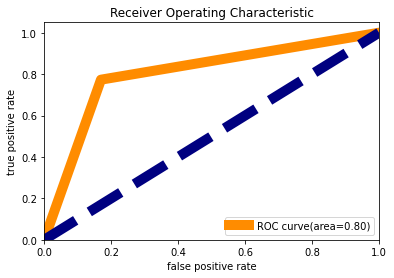

In [133]:
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)'% roc_auc)
plt.plot([0,1],[0,1],color='navy', lw=10, linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

## Saving the Model

In [134]:
import joblib
joblib.dump(Final_model,"Evaluation_Project_9.pkl")

['Evaluation_Project_9.pkl']

## Conclusion

In [135]:
import numpy as np
a=np.array(y_test)
predicted=np.array(pred)
Customer_Churn_Final=pd.DataFrame({"original":a,"predicted":predicted},index=range(len(a)))
Customer_Churn_Final

,original,predicted
0,1.0,1.0
1,0.0,1.0
2,0.0,1.0
3,0.0,1.0
4,0.0,0.0
...,...,...
3410,1.0,1.0
3411,1.0,1.0
3412,0.0,0.0
3413,0.0,1.0


Here 0 denotes No and 1 denotes Yes.